# Ejercicio de machine learning: clasificación y regresión vinícola

En este ejercicio (mucho menos guiado que los anteriores) vas a tener dos objetivos. Para ello, utilizarás un dataset sobre distintos vinos con sus características (como pueden ser la acidez, densidad...). Tendrás que generar, entrenar, validar y testear modelos tanto de clasificación como de regresión.

El dataset proviene de la Universdad de Minho, generado por [P. Cortez](http://www3.dsi.uminho.pt/pcortez/Home.html) et al. Dicho dataset se encuentra en el [*UC Irvine Machine Learning Repository*](https://archive.ics.uci.edu/ml/index.html) ([aquí](https://archive.ics.uci.edu/ml/datasets/Wine+Quality) está disponible; pero debes usar la versión adjunta en la misma carpeta que este documento). Adjunto la descripción del dataset:

```
Citation Request:
  This dataset is public available for research. The details are described in [Cortez et al., 2009]. 
  Please include this citation if you plan to use this database:

  P. Cortez, A. Cerdeira, F. Almeida, T. Matos and J. Reis. 
  Modeling wine preferences by data mining from physicochemical properties.
  In Decision Support Systems, Elsevier, 47(4):547-553. ISSN: 0167-9236.

  Available at: [@Elsevier] http://dx.doi.org/10.1016/j.dss.2009.05.016
                [Pre-press (pdf)] http://www3.dsi.uminho.pt/pcortez/winequality09.pdf
                [bib] http://www3.dsi.uminho.pt/pcortez/dss09.bib

1. Title: Wine Quality 

2. Sources
   Created by: Paulo Cortez (Univ. Minho), Antonio Cerdeira, Fernando Almeida, Telmo Matos and Jose Reis (CVRVV) @ 2009
   
3. Past Usage:

  P. Cortez, A. Cerdeira, F. Almeida, T. Matos and J. Reis. 
  Modeling wine preferences by data mining from physicochemical properties.
  In Decision Support Systems, Elsevier, 47(4):547-553. ISSN: 0167-9236.

  In the above reference, two datasets were created, using red and white wine samples.
  The inputs include objective tests (e.g. PH values) and the output is based on sensory data
  (median of at least 3 evaluations made by wine experts). Each expert graded the wine quality 
  between 0 (very bad) and 10 (very excellent). Several data mining methods were applied to model
  these datasets under a regression approach. The support vector machine model achieved the
  best results. Several metrics were computed: MAD, confusion matrix for a fixed error tolerance (T),
  etc. Also, we plot the relative importances of the input variables (as measured by a sensitivity
  analysis procedure).
 
4. Relevant Information:

   The two datasets are related to red and white variants of the Portuguese "Vinho Verde" wine.
   For more details, consult: http://www.vinhoverde.pt/en/ or the reference [Cortez et al., 2009].
   Due to privacy and logistic issues, only physicochemical (inputs) and sensory (the output) variables 
   are available (e.g. there is no data about grape types, wine brand, wine selling price, etc.).

   These datasets can be viewed as classification or regression tasks.
   The classes are ordered and not balanced (e.g. there are munch more normal wines than
   excellent or poor ones). Outlier detection algorithms could be used to detect the few excellent
   or poor wines. Also, we are not sure if all input variables are relevant. So
   it could be interesting to test feature selection methods. 

5. Number of Instances: red wine - 1599; white wine - 4898. 

6. Number of Attributes: 11 + output attribute
  
   Note: several of the attributes may be correlated, thus it makes sense to apply some sort of
   feature selection.

7. Attribute information:

   For more information, read [Cortez et al., 2009].

   Input variables (based on physicochemical tests):
   1 - fixed acidity
   2 - volatile acidity
   3 - citric acid
   4 - residual sugar
   5 - chlorides
   6 - free sulfur dioxide
   7 - total sulfur dioxide
   8 - density
   9 - pH
   10 - sulphates
   11 - alcohol
   Output variable (based on sensory data): 
   12 - quality (score between 0 and 10)

8. Missing Attribute Values: None
```

    # Además de las 12 variables descritas, el dataset que utilizarás tiene otra: si el vino es blanco o rojo. Dicho esto, los objetivos son:

1. Separar el dataset en training (+ validación si no vas a hacer validación cruzada) y testing, haciendo antes (o después) las transformaciones de los datos que consideres oportunas, así como selección de variables, reducción de dimensionalidad... Puede que decidas usar los datos tal cual vienen también...
2. Hacer un modelo capaz de clasificar lo mejor posible si un vino es blanco o rojo a partir del resto de variables (vas a ver que está chupado conseguir un muy buen resultado).
3. Hacer un modelo regresor que prediga lo mejor posible la calidad de los vinos.

El fichero csv a utilizar `winequality.csv` tiene las cabeceras de cuál es cada variable, y los datos están separados por punto y coma.

Siéntete libre de hacer todo el análisis exploratorio y estadístico (así como gráficos) que quieras antes de lanzarte a hacer modelos.

Y nada más. ¡Ánimo!

In [1]:
import pandas as pd
import numpy as np
# import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import pandas_profiling as pp

# np.set_printoptions(precision=2)
# np.set_printoptions(suppress=True)
# pd.set_option('display.float_format', lambda x: '%.3f' % x)

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
sns.set_style("darkgrid")
sns.set_palette(sns.color_palette("husl"))

In [2]:
df = pd.read_csv('winequality.csv',delimiter=';')

In [3]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,color
0,5.20,0.34,0.00,1.8,0.050,27.0,63.0,0.99160,3.68,0.79,14.0,6,red
1,6.20,0.55,0.45,12.0,0.049,27.0,186.0,0.99740,3.17,0.50,9.3,6,white
2,7.15,0.17,0.24,9.6,0.119,56.0,178.0,0.99578,3.15,0.44,10.2,6,white
3,6.70,0.64,0.23,2.1,0.080,11.0,119.0,0.99538,3.36,0.70,10.9,5,red
4,7.60,0.23,0.34,1.6,0.043,24.0,129.0,0.99305,3.12,0.70,10.4,5,white


- Voy a utulizar la libreria de Pandas Profiling para hacer una primera observación de los datos

In [4]:
profile = pp.ProfileReport(df, title="Wine Quality dataset Description",  dark_mode=True)
profile.to_file("Wine_quality_data_profile.html")

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
profile

## Exploratory Analysis
---

#### Variables que queremos predecir

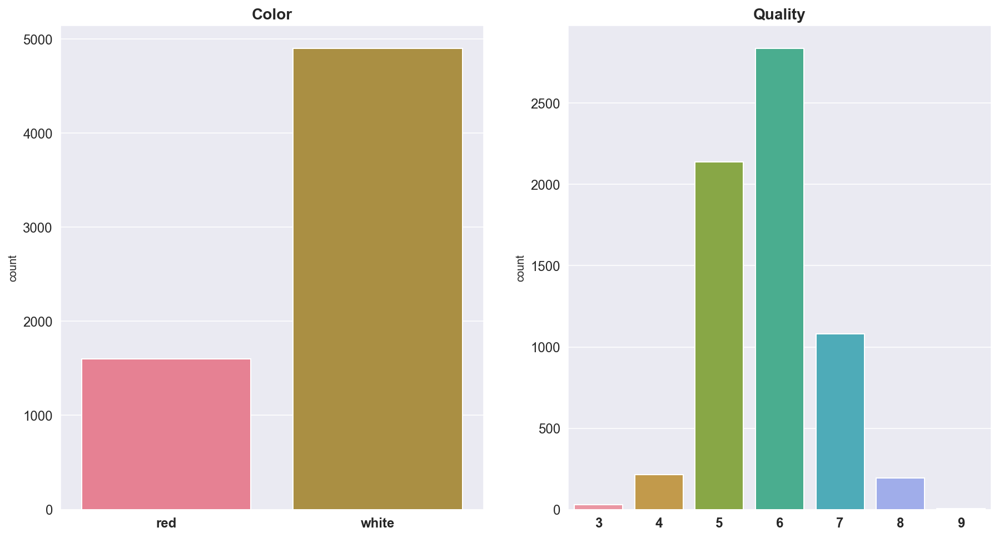

In [6]:
fig = plt.figure(figsize=(15,8))

#  subplot #1
plt.subplot(121)
plt.title('Color',size=14,fontweight='bold')
sns.countplot(data = df, x = 'color')
plt.xlabel(" ",size=14,fontweight='bold')
plt.xticks(size=12,fontweight='bold')
plt.yticks(size=12)

plt.subplot(122)
plt.title('Quality',size=14,fontweight='bold')
sns.countplot(data = df, x = 'quality')
plt.xlabel(" ",size=14,fontweight='bold')
plt.xticks(size=12,fontweight='bold')
plt.yticks(size=12)


plt.show()

Respecto al color, vemos que hay mas aboservaciones de vinos blancos que rojos, y con respecto a la calidad, podemos ver que tiene una distribucion bastante 'normal' con la mayoria de las observaciones con una calidad de 6

## Seccion 1 - Prediciendo el color del vino
---

### Distribuciones Variables Independientes

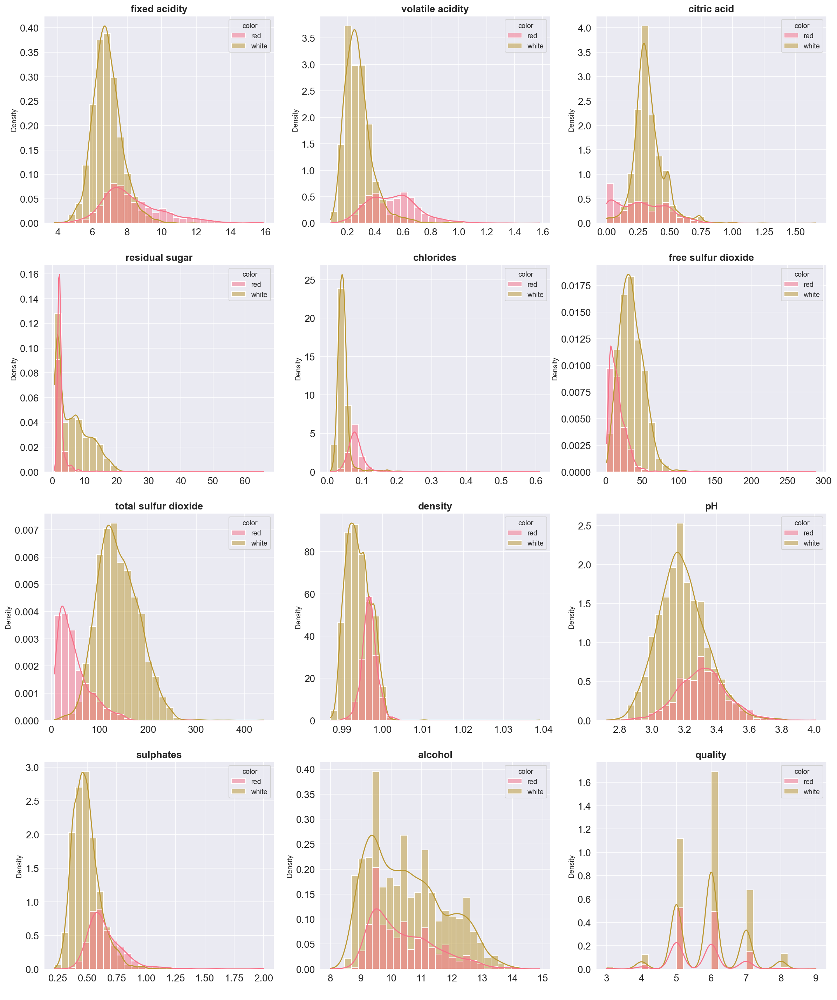

In [7]:
#  Data
df_CAT = df.iloc[:,:12]

# Data
a = 4  # number of rows
b = 3  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(20,25))

for i in df_CAT:
    plt.subplot(a, b, c)
    plt.title('{}'.format(i),size=14,fontweight='bold')
    plt.xlabel(" ",size=14,fontweight='bold')
    plt.xticks(size=14)
    plt.yticks(size=14)
#     sns.histplot(df[i], kde=True, stat="density",bins=30)
    sns.histplot(data = df, x=i, kde=True, stat="density",bins=30, hue='color')
    c = c + 1

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

- Podemos ver de las distribuciones, que 'volatile acidity', 'citric acid', 'chlorides' y 'total sulfur dioxide' tiene distribuciones un poco diferentes entre vinos blancos y rojos. Estas diferencias pueden ser clave para poder diferenciarlos. Vamos a ver los boxplot para entender un poco mas

## BoxPlots

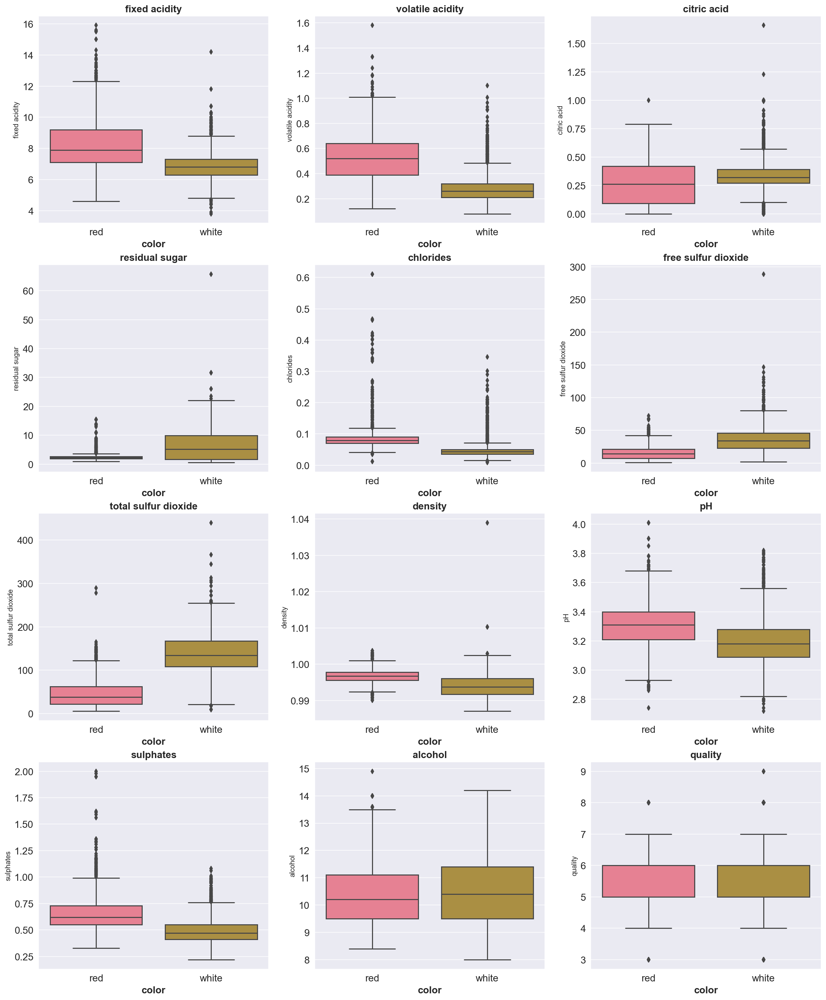

In [8]:
%config InlineBackend.figure_format = 'retina'
df_CAT = df.iloc[:,:12]

#  Data
a = 4  # number of rows
b = 3  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(20,25))

for i in df_CAT:
    plt.subplot(a, b, c)
    plt.title('{}'.format(i),size=14,fontweight='bold')
    plt.xlabel("",size=14,fontweight='bold')
    plt.xticks(size=14)
    plt.yticks(size=14)
#     sns.histplot(df[i], kde=True, stat="density",bins=30)
#     sns.histplot(data = df, x=i, kde=True, stat="density",bins=30, hue='color')
    sns.boxplot(x='color', y=i, data=df)
    c = c + 1

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

- Ahora es mas claro algunas diferencias entre el color de los vinos. Fixed acidity, volatile acidity, chlorides, free sulfur dioxide, total sulfur dioxide, density y suphates toman valores muy particulares con respecto al color

## Correlaciones

In [9]:
from sklearn.preprocessing import LabelEncoder

In [10]:
encoder = LabelEncoder()

df2 = df.iloc[:,:12]
color_to_encode = df.loc[:,'color']

df2['color'] = encoder.fit_transform(color_to_encode)
df2.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,color
0,5.20,0.34,0.00,1.8,0.050,27.0,63.0,0.99160,3.68,0.79,14.0,6,0
1,6.20,0.55,0.45,12.0,0.049,27.0,186.0,0.99740,3.17,0.50,9.3,6,1
2,7.15,0.17,0.24,9.6,0.119,56.0,178.0,0.99578,3.15,0.44,10.2,6,1
3,6.70,0.64,0.23,2.1,0.080,11.0,119.0,0.99538,3.36,0.70,10.9,5,0
4,7.60,0.23,0.34,1.6,0.043,24.0,129.0,0.99305,3.12,0.70,10.4,5,1


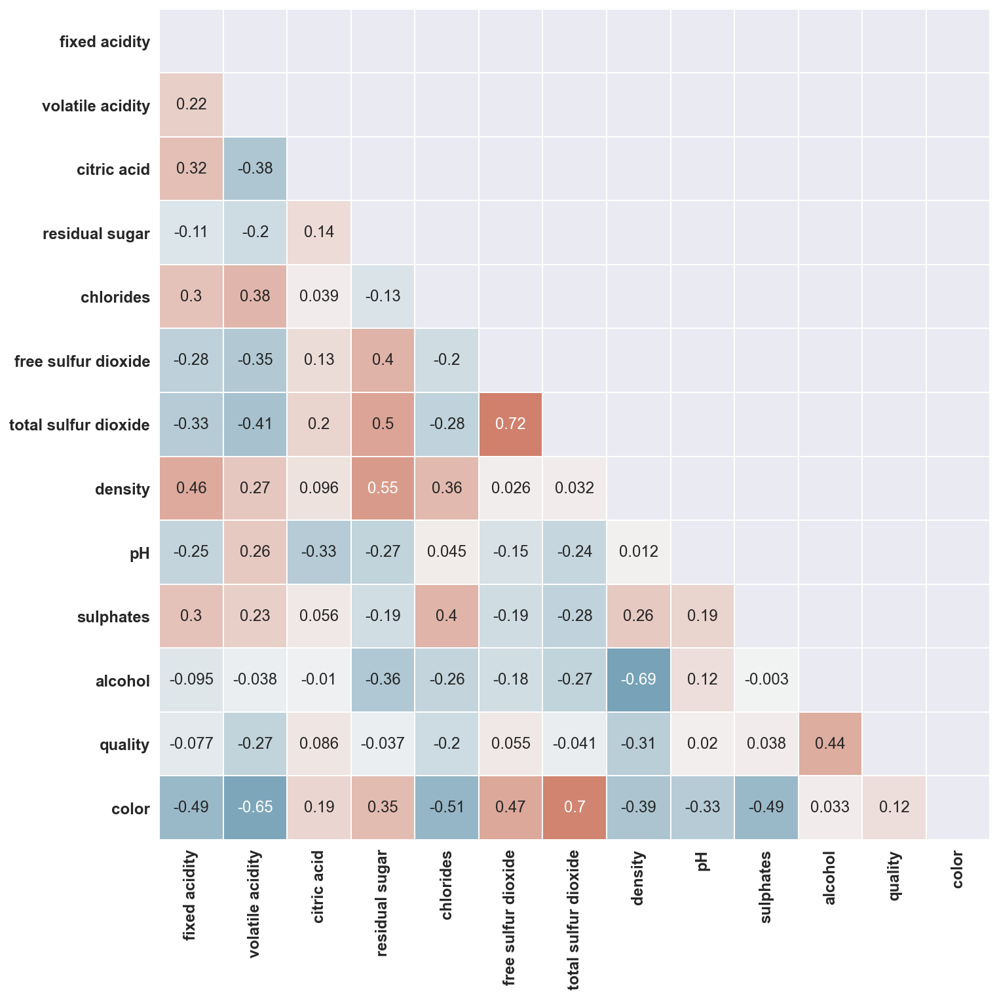

In [11]:
corrMatrix = df2.corr()

mask = np.triu(np.ones_like(corrMatrix, dtype=bool))
cmap = sns.diverging_palette(230, 20, as_cmap=True)

plt.figure(figsize=(25,25))

plt.subplot(121)
sns.heatmap(corrMatrix
            ,annot=True
            ,linewidths=.5
            ,annot_kws={'size':12}
            ,cbar=False
            ,square=True
            ,vmin=-1
            ,vmax=1
            ,center= 0
            ,mask=mask
            ,cmap=cmap
           )
plt.xticks(size=12,fontweight='bold')
plt.yticks(size=12,fontweight='bold')

plt.show()

### p-values de las correlaciones

In [12]:
from scipy import stats

def corr_sig(df2=None):
    p_matrix = np.zeros(shape=(df2.shape[1],df2.shape[1]))
    for col in df2.columns:
        for col2 in df2.drop(col,axis=1).columns:
            _ , p = stats.pearsonr(df2[col],df2[col2])
            p_matrix[df2.columns.to_list().index(col),df2.columns.to_list().index(col2)] = p
    return p_matrix

# p_values = corr_sig(df)
# mask = np.invert(np.tril(p_values<0.05))

In [13]:
p_values = corr_sig(df2.iloc[:,:13])

In [14]:
p_values_df = pd.DataFrame(p_values, columns=df2.iloc[:,:13].columns, index=df2.iloc[:,:13].columns)

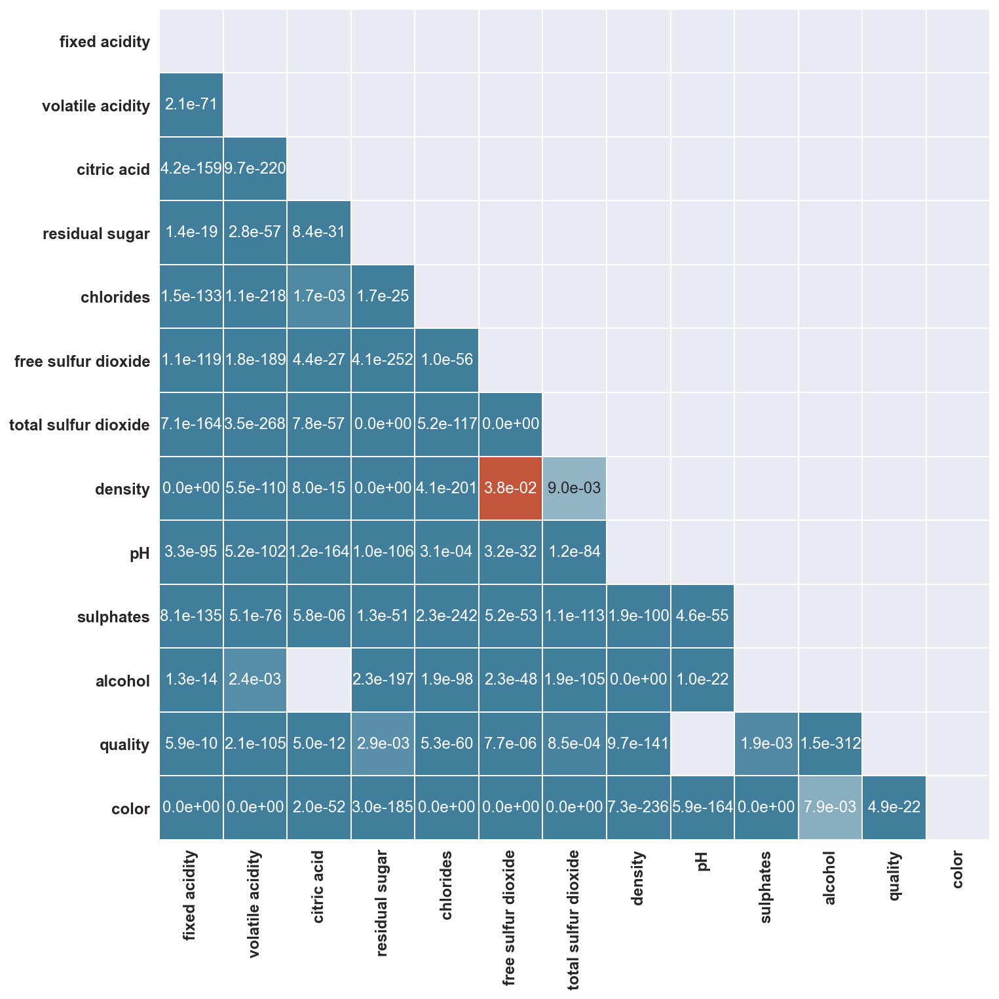

In [15]:
# mask = np.triu(np.ones_like(corrMatrix, dtype=bool))
mask = np.invert(np.tril(p_values<0.05,k=-1))
cmap = sns.diverging_palette(230, 20, as_cmap=True)

plt.figure(figsize=(25,25))

plt.subplot(121)
sns.heatmap(p_values_df
            ,annot=True
            ,fmt="0.1e"
            ,linewidths=.5
            ,annot_kws={'size':12}
            ,cbar=False
            ,square=True
#             ,vmin=-1
#             ,vmax=1
#             ,center= 0
            ,mask=mask
            ,cmap=cmap
           )
plt.xticks(size=12,fontweight='bold')
plt.yticks(size=12,fontweight='bold')

plt.show()

- podemos ver que la mayoria de las correlaciones son significantes, salvo el citric acid con el alcohol y el pH con la calidad

In [16]:
color_corr = pd.DataFrame(df2.corrwith(df2['color']),columns=['correlation']).drop('color')
color_corr.sort_values('correlation',inplace=True,ascending=False)

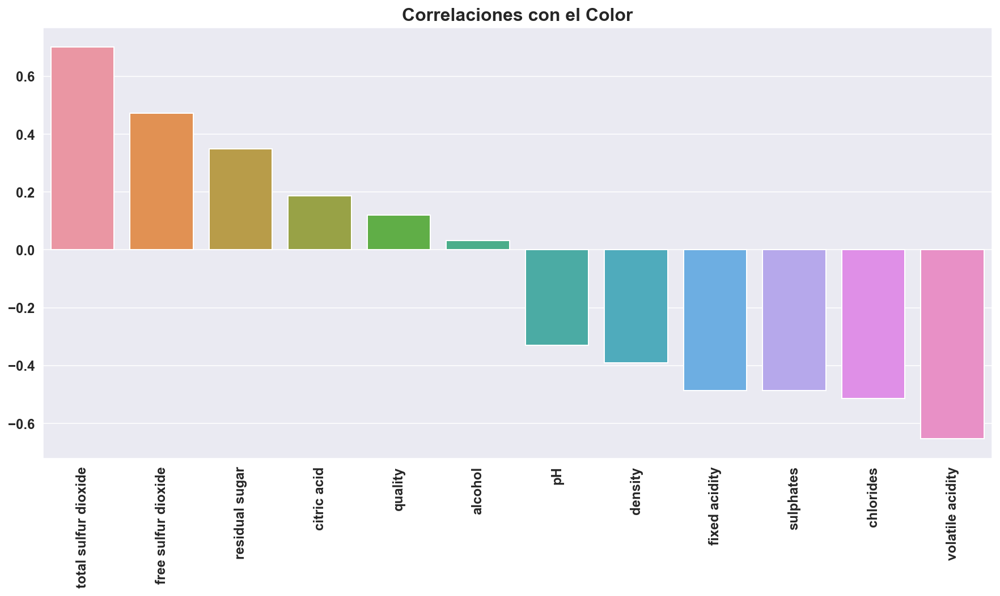

In [17]:
plt.figure(figsize=(15,7))
sns.barplot(x=color_corr.index,y='correlation',data=color_corr)
plt.title("Correlaciones con el Color",size=16,fontweight='bold')
plt.ylabel("")
plt.xticks(size=12,fontweight='bold',rotation='vertical')
plt.yticks(size=12,fontweight='bold')
plt.show()

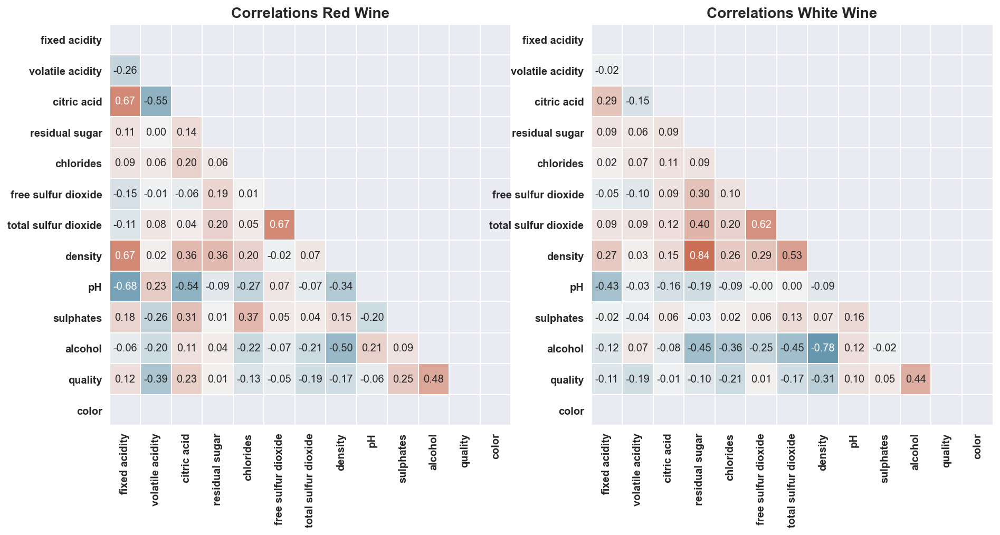

In [18]:
mask = np.triu(np.ones_like(corrMatrix, dtype=bool))
cmap = sns.diverging_palette(230, 20, as_cmap=True)

plt.figure(figsize=(15,15))

plt.subplot(121)
sns.heatmap(df2.loc[df2.color==0].corr()
            ,annot=True
            ,fmt="0.2f"
            ,linewidths=.5
            ,annot_kws={'size':10}
            ,cbar=False
            ,square=True
            ,vmin=-1
            ,vmax=1
            ,center= 0
            ,mask=mask
            ,cmap=cmap
           )
plt.title('Correlations Red Wine',size=14,fontweight='bold')
plt.xticks(size=10,fontweight='bold')
plt.yticks(size=10,fontweight='bold')

plt.subplot(122)
sns.heatmap(df2.loc[df2.color==1].corr()
            ,annot=True
            ,fmt="0.2f"
            ,linewidths=.5
            ,annot_kws={'size':10}
            ,cbar=False
            ,square=True
            ,vmin=-1
            ,vmax=1
            ,center= 0
            ,mask=mask
            ,cmap=cmap
           )
plt.title('Correlations White Wine',size=14,fontweight='bold')
plt.xticks(size=10,fontweight='bold')
plt.yticks(size=10,fontweight='bold')

plt.show()

## Modelos para predicir el color (Clasificacion)
---

### Data pre-processing - Train / Test split 

In [19]:
df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000
mean,7.215307,0.339666,0.318633,5.443235,0.056034,30.525319,115.744574,0.994697,3.218501,0.531268,10.491801,5.818378
std,1.296434,0.164636,0.145318,4.757804,0.035034,17.749400,56.521855,0.002999,0.160787,0.148806,1.192712,0.873255
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992340,3.110000,0.430000,9.500000,5.000000
50%,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000,6.000000
75%,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.996990,3.320000,0.600000,11.300000,6.000000
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000,9.000000


In [20]:
from sklearn.preprocessing import LabelEncoder

In [21]:
encoder = LabelEncoder()

X = df.loc[:,'fixed acidity':'quality']
y_to_encode = df.loc[:,'color']

y = encoder.fit_transform(y_to_encode)

X.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,5.20,0.34,0.00,1.8,0.050,27.0,63.0,0.99160,3.68,0.79,14.0,6
1,6.20,0.55,0.45,12.0,0.049,27.0,186.0,0.99740,3.17,0.50,9.3,6
2,7.15,0.17,0.24,9.6,0.119,56.0,178.0,0.99578,3.15,0.44,10.2,6
3,6.70,0.64,0.23,2.1,0.080,11.0,119.0,0.99538,3.36,0.70,10.9,5
4,7.60,0.23,0.34,1.6,0.043,24.0,129.0,0.99305,3.12,0.70,10.4,5


In [22]:
y

array([0, 1, 1, ..., 1, 1, 0])

In [23]:
list(encoder.classes_)

['red', 'white']

In [24]:
from sklearn.model_selection import train_test_split

train_ratio = 0.7
validation_ratio = 0.15
test_ratio = 0.15

# Train - Test split
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=1 - train_ratio)

# validation split data set
x_val, x_test, y_val, y_test = train_test_split(x_test, y_test, test_size=test_ratio/(test_ratio + validation_ratio)) 

In [25]:
x_train.shape,x_test.shape,x_val.shape

((4547, 12), (975, 12), (975, 12))

In [26]:
y_train.shape,y_test.shape,y_val.shape

((4547,), (975,), (975,))

### Primer approach: Logistic Regression

In [27]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import plot_roc_curve

logreg = LogisticRegression(random_state=123,max_iter=1000)

logreg.fit(x_train,y_train)

LogisticRegression(max_iter=1000, random_state=123)

In [28]:
logreg.score(x_train, y_train)

0.9848251594457884

In [29]:
logreg.score(x_val, y_val)

0.9856410256410256

esta chupado.... Tenemos un score muy alto sin casi hacer ninguna transformacion de los datos

In [30]:
y_pred=logreg.predict(x_val)

In [31]:
train_accuracy = logreg.score(x_train, y_train)
val_accuracy = logreg.score(x_val, y_val)
print('Logistic Reggresion', '-'*35, 
      'Accuracy in Train Group   : {:.4f}'.format(train_accuracy), 
      'Accuracy in Val   Group   : {:.4f}'.format(val_accuracy), sep='\n')

Logistic Reggresion
-----------------------------------
Accuracy in Train Group   : 0.9848
Accuracy in Val   Group   : 0.9856


In [32]:
from sklearn import metrics
cnf_matrix = metrics.confusion_matrix(y_val, y_pred)
cm = pd.DataFrame(cnf_matrix,columns=list(encoder.classes_),index=['red','white'])

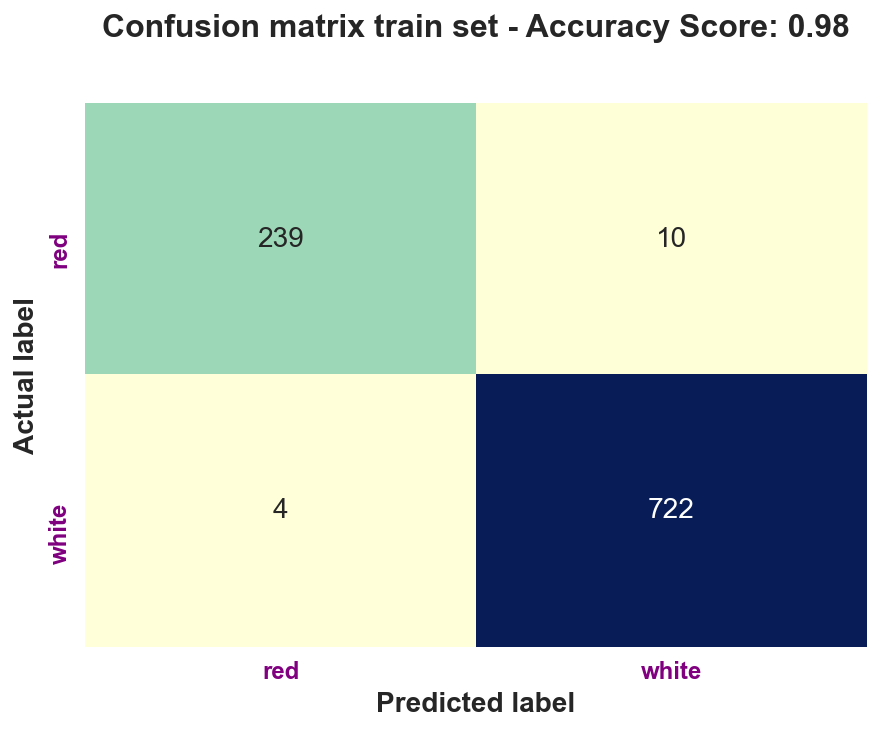

In [33]:
score = logreg.score(x_train, y_train)
plt.figure(figsize=(7,5))

# create heatmap
sns.heatmap(cm, annot=True,annot_kws={'size':14}, cmap="YlGnBu" ,fmt='g',cbar=False)
plt.xticks(size=12,fontweight='bold')
plt.yticks(size=12,fontweight='bold')
plt.tick_params(axis="y", colors="purple")
plt.tick_params(axis="x", colors="purple")
plt.title('Confusion matrix train set - Accuracy Score: {:.2f}'.format(score), y=1.1, size=16,fontweight='bold')
plt.ylabel('Actual label',size=14,fontweight='bold')
plt.xlabel('Predicted label',size=14,fontweight='bold')
plt.show()


- El modelo de 'logist regression' tiene muy buen resultado con una alta presicion.  

Para poder comparar varios modelos, voy a crear una funcion para entrenar varios classifiers y que nos devuelva las metricas de evaluacion en una tabla para poder compararlos

In [34]:
# Import required libraries for machine learning classifiers
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import SGDClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics

pd.set_option("display.precision", 8)


# Instantiate the machine learning classifiers
log_model = LogisticRegression(random_state=123,max_iter=1000)
svc_model = LinearSVC(dual=False,random_state=123)
dtr_model = DecisionTreeClassifier(max_depth =4,random_state=40)
rfc_model = RandomForestClassifier(n_estimators =3,random_state=123)
gnb_model = GaussianNB()
sgd_model = SGDClassifier(random_state=123)
knn = KNeighborsClassifier(n_neighbors=1)

models= [log_model,knn,svc_model, dtr_model, gnb_model,sgd_model, rfc_model]



class eva_models(object):
    def __init__(self,x_train,y_train,x_val,y_val):
        self.x_train=x_train
        self.y_train=y_train
        self.x_val=x_val
        self.y_val=y_val
        
    def evaluation_train(self):
    
        y_pred_models=[]
        scores=[]
        for model in models:
            model.fit(self.x_train, self.y_train)
            pred=model.predict(self.x_train)
            y_pred_models.append(model.predict(self.x_train))
            scores.append([metrics.precision_score(self.y_train,pred),
                           metrics.recall_score(self.y_train,pred),
                           metrics.fbeta_score(self.y_train,pred,beta=1),
                           metrics.fbeta_score(self.y_train,pred,beta=2),
                           metrics.fbeta_score(self.y_train,pred,beta=0.5),
                           model.score(self.x_train,self.y_train)])


        ev = {}
        key = range(len(models))

        for i in key:
            ev[type(models[i]).__name__] = scores[i]


        evaluation = pd.DataFrame(ev, index=['precision','recall','F1','F2','F0.5','accurancy score'])

        evaluation['Best Score (row)'] = evaluation.idxmax(axis=1)

        return evaluation
    
    def evaluation_val(self):
        
        y_val_pred_models=[]
        scores_val=[]
        for model in models:
        #     model.fit(X, y)
            pred_val=model.predict(self.x_val)
            y_val_pred_models.append(model.predict(self.x_val))
            scores_val.append([metrics.precision_score(self.y_val,pred_val),
                               metrics.recall_score(self.y_val,pred_val),
                               metrics.fbeta_score(self.y_val,pred_val,beta=1),
                               metrics.fbeta_score(self.y_val,pred_val,beta=2),
                               metrics.fbeta_score(self.y_val,pred_val,beta=0.5),
                               model.score(self.x_val,self.y_val)])


        evp = {}
        # model_name=[]
        key = range(len(models))

        for i in key:
            evp[type(models[i]).__name__] = scores_val[i]


        evaluation_val = pd.DataFrame(evp, index=['precision','recall','F1','F2','F0.5','accurancy score'])

        evaluation_val['Best Score (row)'] = evaluation_val.idxmax(axis=1)

        return evaluation_val
        

In [35]:
test = eva_models(x_train,y_train,x_val,y_val)

#### Metricas de evaluacion en Train set

In [36]:
test.evaluation_train()

,LogisticRegression,KNeighborsClassifier,LinearSVC,DecisionTreeClassifier,GaussianNB,SGDClassifier,RandomForestClassifier,Best Score (row)
precision,0.98573508,1.0,0.98917496,0.98949825,0.98980815,0.95358770,0.99707260,KNeighborsClassifier
recall,0.99412801,1.0,0.99266001,0.99588961,0.96946565,0.98326483,1.00000000,KNeighborsClassifier
F1,0.98991376,1.0,0.99091442,0.99268364,0.97953130,0.96819890,0.99853415,KNeighborsClassifier
F2,0.99243801,1.0,0.99196104,0.99460474,0.97346698,0.97718254,0.99941315,KNeighborsClassifier
F0.5,0.98740231,1.0,0.98987001,0.99076995,0.98567164,0.95937894,0.99765671,KNeighborsClassifier
accurancy score,0.98482516,1.0,0.98636464,0.98900374,0.96965032,0.95161645,0.99780075,KNeighborsClassifier


#### Metricas de evaluacion en Validation set

In [37]:
test.evaluation_val()

,LogisticRegression,KNeighborsClassifier,LinearSVC,DecisionTreeClassifier,GaussianNB,SGDClassifier,RandomForestClassifier,Best Score (row)
precision,0.98633880,0.96978022,0.98772169,0.97959184,0.98746518,0.94827586,0.98772169,LinearSVC
recall,0.99449036,0.97245179,0.99724518,0.99173554,0.97658402,0.98484848,0.99724518,LinearSVC
F1,0.99039781,0.97111417,0.99246059,0.98562628,0.98199446,0.96621622,0.99246059,LinearSVC
F2,0.99284928,0.97191630,0.99532582,0.98928277,0.97874103,0.97731001,0.99532582,LinearSVC
F0.5,0.98795840,0.97031336,0.98961181,0.98199673,0.98526959,0.95537146,0.98961181,LinearSVC
accurancy score,0.98564103,0.95692308,0.98871795,0.97846154,0.97333333,0.94871795,0.98871795,LinearSVC


- Podemos ver que en el train set, KNN es el que tiene las metricas mas altas en cada fila, pero en el validation set, Random Forest es el modelo que tiene las mejores metricas 
  
  
- En el siguiente grafico podemos ver que el numero de k para KNN con mayor precision es 1 

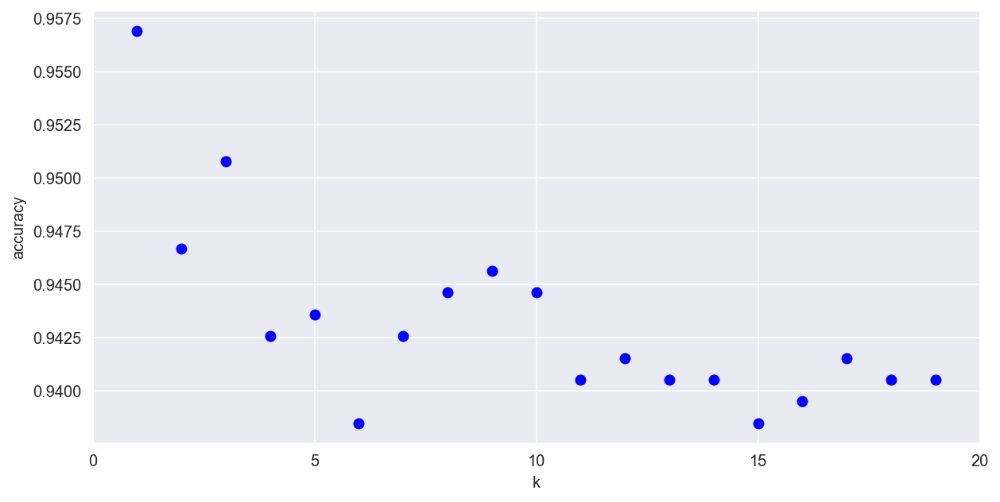

In [38]:
k_range = range(1,20)
scores = []

for k in k_range:
    knn = KNeighborsClassifier(n_neighbors = k)
    knn.fit(x_train, y_train)
    scores.append(knn.score(x_val,y_val))
    
plt.figure(figsize=(10,5))
plt.xlabel('k')
plt.ylabel('accuracy')
#plt.scatter(k_range, scores)
plt.plot(k_range,scores,"bo")
plt.xticks([0,5,10,15,20]);

- Vamos a analizar el modelo 'Decision tree' para entender la importancia de cada metrica del data set para predecir el color

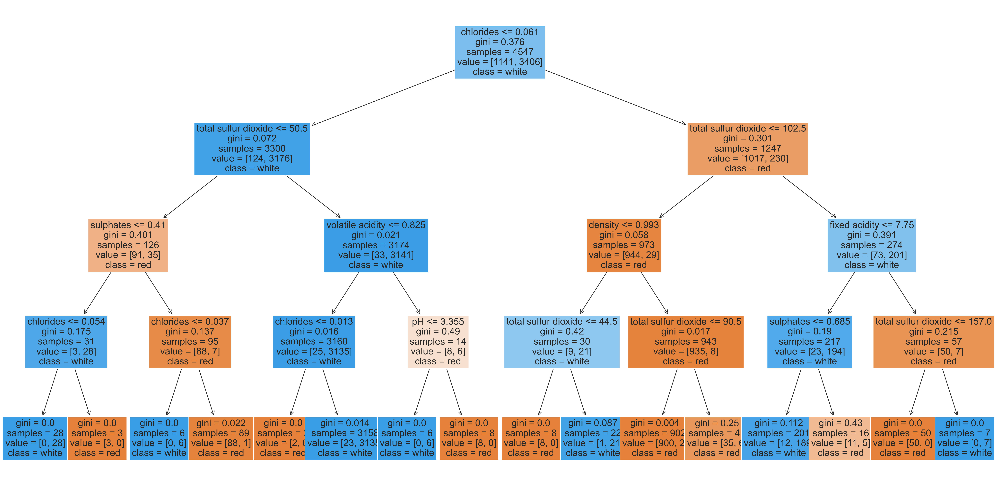

In [39]:
%config InlineBackend.figure_format = 'png'
from sklearn import tree


fig = plt.figure(figsize=(30,15),dpi=300)
tree.plot_tree(dtr_model,fontsize=16,feature_names=x_train.columns,  
                   class_names=['red','white'],
                   filled=True) 

plt.show()

In [40]:
fi = pd.DataFrame({'Feature name':x_train.columns,'Feature Importance':dtr_model.feature_importances_})

In [41]:
fi.sort_values('Feature Importance',inplace=True,ascending=False)

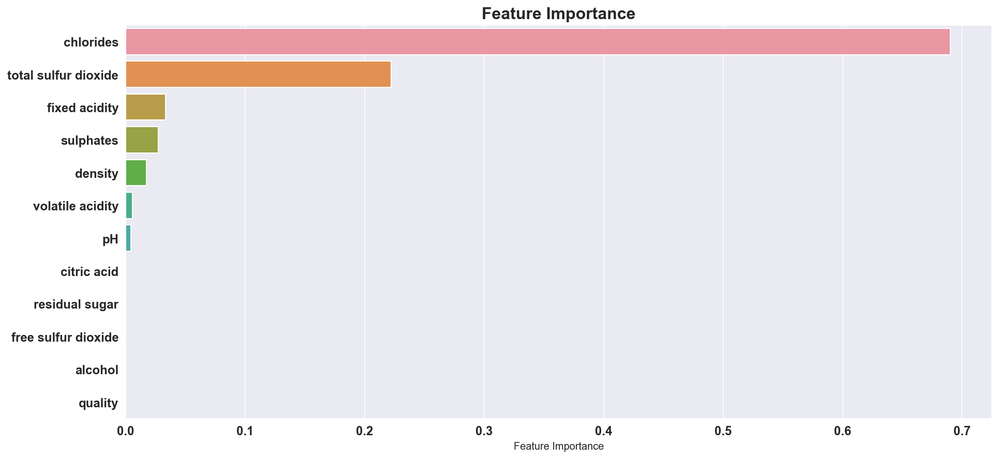

In [42]:
%config InlineBackend.figure_format = 'retina'
plt.figure(figsize=(15,7))
sns.barplot(x='Feature Importance',y='Feature name',data=fi)
plt.title("Feature Importance",size=16,fontweight='bold')
plt.ylabel("")
plt.xticks(size=12,fontweight='bold')
plt.yticks(size=12,fontweight='bold')
plt.show()

- Como habiamos visto en el analysis de correlaciones, para este modelo podemos considerar que total sulfur dioxide, chlorides, volatile acidity, y sulphates son las variables que tienen mayor importancia para predecir el color. En los boxplot siguientes, estas diferencias entre vinos rojos y blancos se hacen mas evidentes

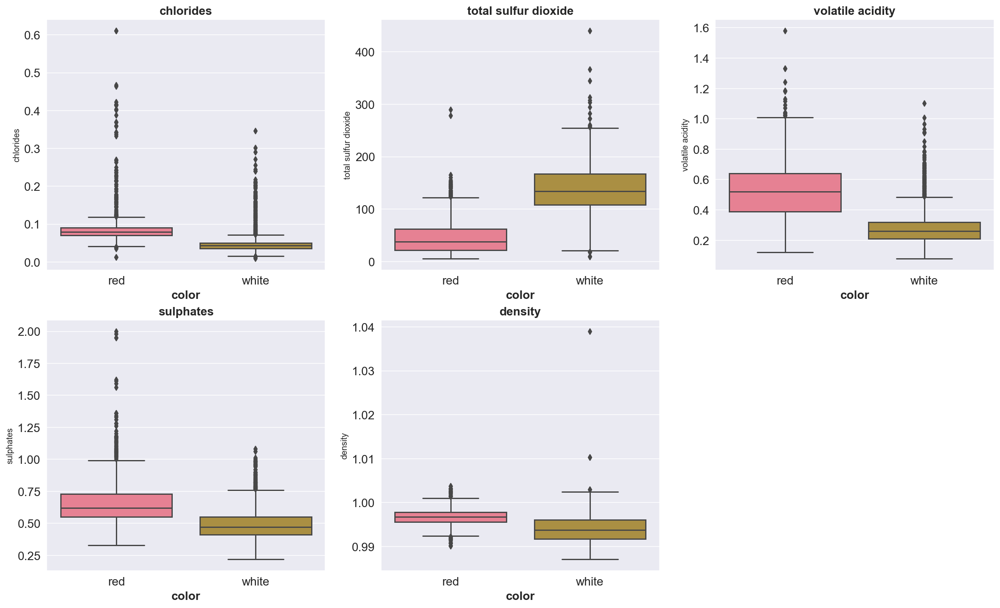

In [43]:
df_CAT = [ 'chlorides','total sulfur dioxide','volatile acidity','sulphates','density']

#  Categorical Data
a = 4  # number of rows
b = 3  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(20,25))

for i in df_CAT:
    plt.subplot(a, b, c)
    plt.title('{}'.format(i),size=14,fontweight='bold')
    plt.xlabel("",size=14,fontweight='bold')
    plt.xticks(size=14)
    plt.yticks(size=14)
#     sns.histplot(df[i], kde=True, stat="density",bins=30)
#     sns.histplot(data = df, x=i, kde=True, stat="density",bins=30, hue='color')
    sns.boxplot(x='color', y=i, data=df)
    c = c + 1

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

## Sección 2 - Regresión Quality
--- 

Preparando el data set para trabajar con regresiones 

In [44]:
encoder_color = LabelEncoder()

In [45]:
df['color_enc'] = encoder_color.fit_transform(df['color'])

In [46]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,color,color_enc
0,5.20,0.34,0.00,1.8,0.050,27.0,63.0,0.99160,3.68,0.79,14.0,6,red,0
1,6.20,0.55,0.45,12.0,0.049,27.0,186.0,0.99740,3.17,0.50,9.3,6,white,1
2,7.15,0.17,0.24,9.6,0.119,56.0,178.0,0.99578,3.15,0.44,10.2,6,white,1
3,6.70,0.64,0.23,2.1,0.080,11.0,119.0,0.99538,3.36,0.70,10.9,5,red,0
4,7.60,0.23,0.34,1.6,0.043,24.0,129.0,0.99305,3.12,0.70,10.4,5,white,1


In [47]:
dfr = df.loc[:,'fixed acidity':'quality']
dfr['color_enc'] = df['color_enc']
dfr.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,color_enc
0,5.20,0.34,0.00,1.8,0.050,27.0,63.0,0.99160,3.68,0.79,14.0,6,0
1,6.20,0.55,0.45,12.0,0.049,27.0,186.0,0.99740,3.17,0.50,9.3,6,1
2,7.15,0.17,0.24,9.6,0.119,56.0,178.0,0.99578,3.15,0.44,10.2,6,1
3,6.70,0.64,0.23,2.1,0.080,11.0,119.0,0.99538,3.36,0.70,10.9,5,0
4,7.60,0.23,0.34,1.6,0.043,24.0,129.0,0.99305,3.12,0.70,10.4,5,1


In [48]:
g = pd.DataFrame(dfr.corrwith(dfr['quality']),columns=['correlation']).drop('quality')
g.sort_values('correlation',inplace=True,ascending=False)

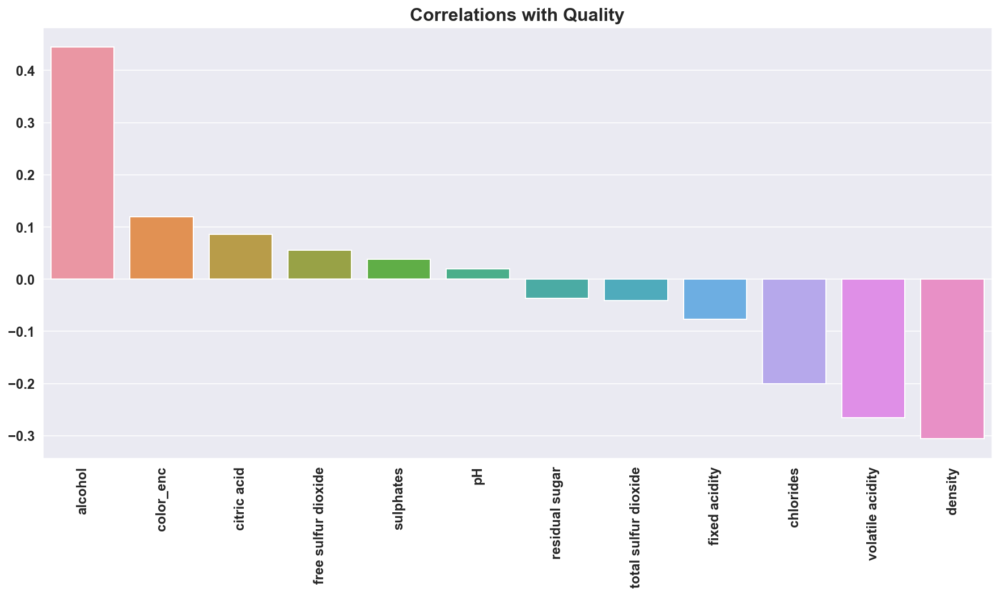

In [49]:
plt.figure(figsize=(15,7))
sns.barplot(x=g.index,y='correlation',data=g)
plt.title("Correlations with Quality",size=16,fontweight='bold')
plt.ylabel("")
plt.xticks(size=12,fontweight='bold',rotation='vertical')
plt.yticks(size=12,fontweight='bold')
plt.show()

En relación con la calidad, el alcohol y la densidad son las variables con correlaciones mas fuertes. Al mismo timepo el alcohol y la densidad estan fuertemente relacionadas, ya que la densidad es la cantidad de azucares presentes y el acohol es la transformacion de esos azucares en alcohol a traves de las levaduras del vino. De aqui que los 'chlorides' y las variables que representan acidez tambien pueden jugar un papel muy importante con respecto a la calidad

In [50]:
dfr.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,color_enc
0,5.20,0.34,0.00,1.8,0.050,27.0,63.0,0.99160,3.68,0.79,14.0,6,0
1,6.20,0.55,0.45,12.0,0.049,27.0,186.0,0.99740,3.17,0.50,9.3,6,1
2,7.15,0.17,0.24,9.6,0.119,56.0,178.0,0.99578,3.15,0.44,10.2,6,1
3,6.70,0.64,0.23,2.1,0.080,11.0,119.0,0.99538,3.36,0.70,10.9,5,0
4,7.60,0.23,0.34,1.6,0.043,24.0,129.0,0.99305,3.12,0.70,10.4,5,1


In [51]:
X = df.loc[:,'fixed acidity':'alcohol']
X['color_enc'] = dfr['color_enc']
X.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,color_enc
0,5.20,0.34,0.00,1.8,0.050,27.0,63.0,0.99160,3.68,0.79,14.0,0
1,6.20,0.55,0.45,12.0,0.049,27.0,186.0,0.99740,3.17,0.50,9.3,1
2,7.15,0.17,0.24,9.6,0.119,56.0,178.0,0.99578,3.15,0.44,10.2,1
3,6.70,0.64,0.23,2.1,0.080,11.0,119.0,0.99538,3.36,0.70,10.9,0
4,7.60,0.23,0.34,1.6,0.043,24.0,129.0,0.99305,3.12,0.70,10.4,1


In [52]:
y=dfr['quality']
y.head()

0    6
1    6
2    6
3    5
4    5
Name: quality, dtype: int64

### Linear regression

In [53]:
from sklearn.linear_model import LinearRegression

In [54]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

In [55]:
x_train.shape,x_test.shape

((4547, 12), (1950, 12))

In [56]:
y_train.shape,y_test.shape

((4547,), (1950,))

In [57]:
lm = LinearRegression()

In [58]:
lm.fit(x_train,y_train)

LinearRegression()

In [59]:
print(lm.intercept_)

113.42936334279052


In [60]:
y_pred_train = lm.predict(x_train).round().astype(int)

In [61]:
y_pred_test = lm.predict(x_test).round().astype(int)

In [62]:
print('Training model', '-'*35,
'MAE: {:.4f}'.format( metrics.mean_absolute_error(y_train, y_pred_train)),
'MSE: {:.4f}'.format(metrics.mean_squared_error(y_train, y_pred_train)),
'RMSE: {:.4f}'.format(np.sqrt(metrics.mean_squared_error(y_train, y_pred_train))),
'score: {:.4f}'.format(lm.score(x_train, y_train)),
'\n', sep='\n')

print('Test model', '-'*35,
'MAE: {:.4f}'.format(metrics.mean_absolute_error(y_test, y_pred_test)),
'MSE: {:.4f}'.format(metrics.mean_squared_error(y_test, y_pred_test)),
'RMSE: {:.4f}'.format(np.sqrt(metrics.mean_squared_error(y_test, y_pred_test))),
'score: {:.4f}'.format(lm.score(x_test, y_test)),      
sep='\n')

Training model
-----------------------------------
MAE: 0.5069
MSE: 0.6116
RMSE: 0.7821
score: 0.3090


Test model
-----------------------------------
MAE: 0.5400
MSE: 0.6621
RMSE: 0.8137
score: 0.2660


- La regresion lineal tiene un performance bastante pobre en train y test. Otro problema es querer predecir un numero entero, ya que los regressors que utilizemos nos devolveran un array de floats. La prediccion de la calidad deberia entenderse como un problema de clasificación. 
   
   
- En la matriz de confucion siguiente podemos ver que el modelo no es capaz de predicir calidades bajas (3 y 4) y calidades altas (8 y 9)

In [63]:
cnf_matrix = metrics.confusion_matrix(y_test, y_pred_test)
cnf_matrix
cm = pd.DataFrame(cnf_matrix,columns=set(y_test),index=set(y_test))

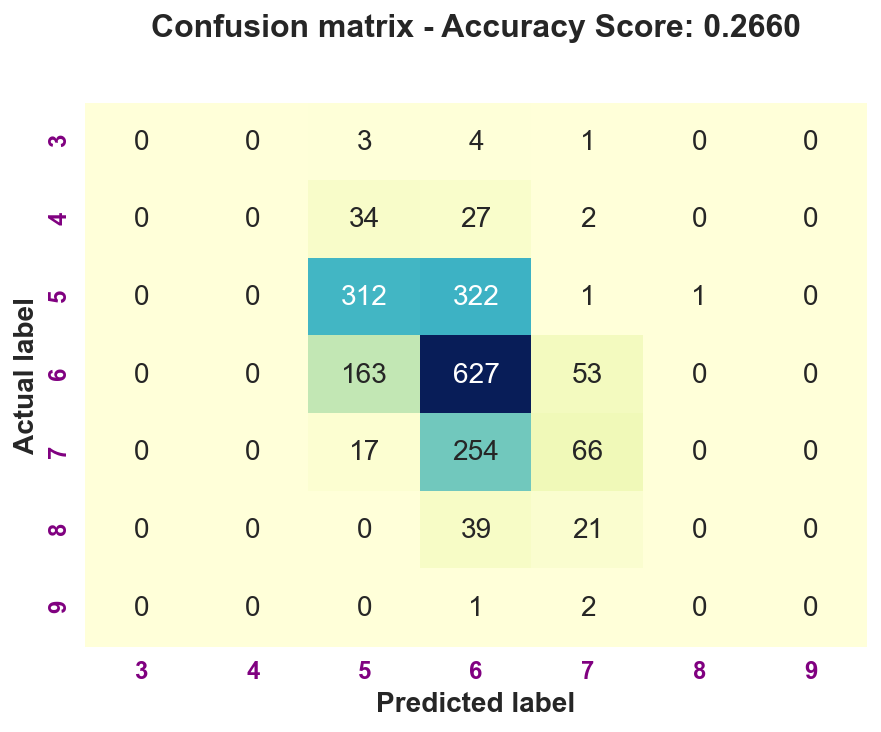

In [64]:
score = lm.score(x_test, y_test)
plt.figure(figsize=(7,5))

# create heatmap
sns.heatmap(cm, annot=True,annot_kws={'size':14}, cmap="YlGnBu" ,fmt='g',cbar=False)
plt.xticks(size=12,fontweight='bold')
plt.yticks(size=12,fontweight='bold')
plt.tick_params(axis="y", colors="purple")
plt.tick_params(axis="x", colors="purple")
plt.title('Confusion matrix - Accuracy Score: {:.4f}'.format(score), y=1.1, size=16,fontweight='bold')
plt.ylabel('Actual label',size=14,fontweight='bold')
plt.xlabel('Predicted label',size=14,fontweight='bold')
plt.show()

#### Data Transformation - PCA
---
Vamos a probar standarizando los datos para ver si podemos conseguir un mejor modelo y tambien vamos a usar un 'Principal Component Analisys' para ver si reduciendo las variables los modelos responden mejor

In [65]:
from sklearn import preprocessing
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA

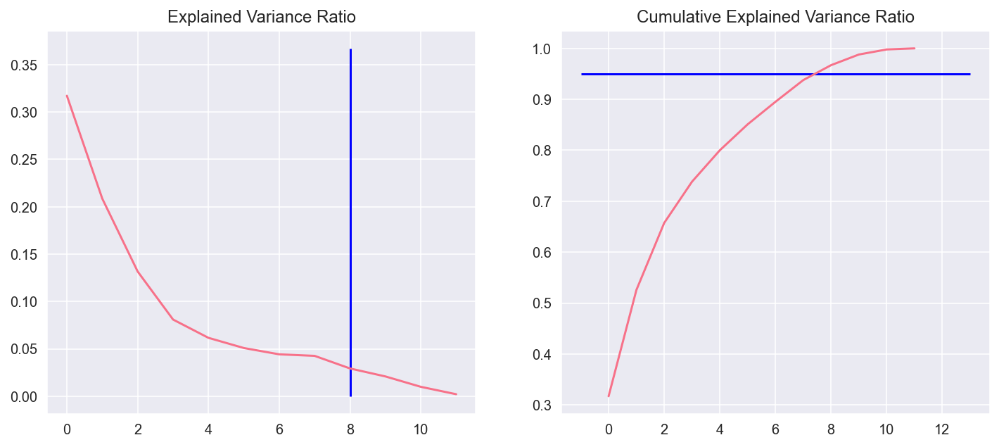

In [66]:
pca = Pipeline([
    ("scaler", preprocessing.StandardScaler()),
    ("decomposition", PCA())
]).fit(x_train)

# ------------------------------------------------------
# Plot

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

n_components = .95
x = (pca.named_steps["decomposition"].explained_variance_ratio_.cumsum() < n_components).sum()

ax1.plot(pca.named_steps["decomposition"].explained_variance_ratio_)
ax1.set_title("Explained Variance Ratio")
ax1.vlines(x, 0, pca.named_steps["decomposition"].explained_variance_ratio_.max() + .05, color="blue")

ax2.plot(pca.named_steps["decomposition"].explained_variance_ratio_.cumsum())
ax2.hlines(n_components, -1, x_train.shape[1] + 1, color="blue")
ax2.set_title("Cumulative Explained Variance Ratio")

plt.show()

Del analisis de PCA podemos ver que con 8 componentes somos capaces de explicar el 95% de la varianza de los datos

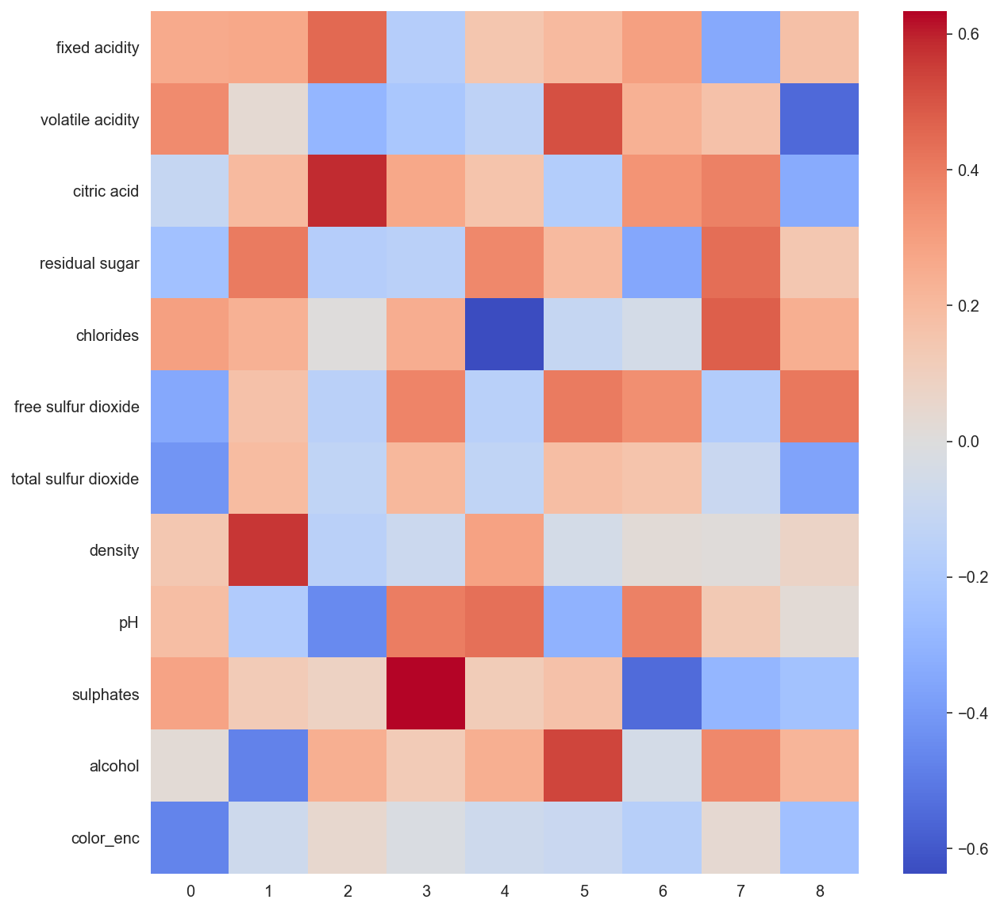

In [67]:
f, ax = plt.subplots(1, 1, figsize=(10, 10))
sns.heatmap(
    pd.DataFrame(pca.named_steps["decomposition"].components_, columns=x_train.columns).iloc[:9].T,
    cmap="coolwarm",
    center=0,
    ax=ax
)
plt.show()

Podemos ver la relacion de los componentes con cada variable. Por ejemplo el 'componente 0' esta bastante relacionado a explicar el color, donde las variables color, total sulfur dioxide, free sulfur dioxide, chlorides y volatile acidity son las que mas pesos tienen en este componente. (esto esta bastante en linea con el primer ejercicion donde analizamos las principales variables para predecir el color)  
Siguiendo la misma linea el componente 1 esta relacionado con el alcohol: la densidad es la cantidad de azucares en el vino, las levaduras consumen estos azucares transformandolo en alcohol, por lo tanto a mayor densidad menor alcohol generado por las levaduras, y a menor densidad (las levaduras han consumido mas azucares), el alcohol es mayor. 

---
Vamos a crear un pipeline para probar si con un PCA podemos mejorar el score de los modelos

In [68]:
linear_regression_pca = Pipeline([
    ("scaler", preprocessing.StandardScaler()),
    ("decomposition", PCA(.95)),
    ("regressor", LinearRegression())
])

linear_regression_pca.fit(x_train, y_train)

y_pred_train = linear_regression_pca.predict(x_train).round().astype(int)

y_pred_test = linear_regression_pca.predict(x_test).round().astype(int)

# ---------------------------------------
# Print Resultados

print('Training model', '-'*35,
'MAE: {:.4f}'.format( metrics.mean_absolute_error(y_train, y_pred_train)),
'MSE: {:.4f}'.format(metrics.mean_squared_error(y_train, y_pred_train)),
'RMSE: {:.4f}'.format(np.sqrt(metrics.mean_squared_error(y_train, y_pred_train))),
'score: {:.4f}'.format(lm.score(x_train, y_train)),
'\n', sep='\n')

print('Test model', '-'*35,
'MAE: {:.4f}'.format(metrics.mean_absolute_error(y_test, y_pred_test)),
'MSE: {:.4f}'.format(metrics.mean_squared_error(y_test, y_pred_test)),
'RMSE: {:.4f}'.format(np.sqrt(metrics.mean_squared_error(y_test, y_pred_test))),
'score: {:.4f}'.format(lm.score(x_test, y_test)),      
sep='\n')

Training model
-----------------------------------
MAE: 0.5067
MSE: 0.6136
RMSE: 0.7833
score: 0.3090


Test model
-----------------------------------
MAE: 0.5410
MSE: 0.6662
RMSE: 0.8162
score: 0.2660


- La Regresion lineal no moddifica su resultado utilizando PCA

---



#### Random Forest

In [69]:
from sklearn.ensemble import RandomForestRegressor

rf = RandomForestRegressor()


rf.fit(x_train, y_train)

y_pred_train_nopca = rf.predict(x_train).round().astype(int)

y_pred_test_nopca = rf.predict(x_test).round().astype(int)

# ---------------------------------------

rf_pca = Pipeline([
    ("scaler", preprocessing.StandardScaler()),
    ("decomposition", PCA(.95)),
    ("regressor", RandomForestRegressor())
])


rf_pca.fit(x_train, y_train)

y_pred_train_pca = rf_pca.predict(x_train).round().astype(int)

y_pred_test_pca = rf_pca.predict(x_test).round().astype(int)

# ---------------------------------------
# Print Resultados


print(pd.DataFrame({'Train set sin PCA':[metrics.mean_absolute_error(y_train, y_pred_train_nopca)
                          ,metrics.mean_squared_error(y_train, y_pred_train_nopca)
                          ,np.sqrt(metrics.mean_squared_error(y_train, y_pred_train_nopca))
                          ,rf.score(x_train, y_train)]
                    ,'Train set con PCA':[metrics.mean_absolute_error(y_train, y_pred_train_pca)
                          ,metrics.mean_squared_error(y_train, y_pred_train_pca)
                          ,np.sqrt(metrics.mean_squared_error(y_train, y_pred_train_pca))
                          ,rf_pca.score(x_train, y_train)]}
            ,index=['MAE','MSE','RMSE','Score']))

print('\n')

print(pd.DataFrame({'Test set sin PCA':[metrics.mean_absolute_error(y_test, y_pred_test_nopca)
                          ,metrics.mean_squared_error(y_test, y_pred_test_nopca)
                          ,np.sqrt(metrics.mean_squared_error(y_test, y_pred_test_nopca))
                          ,rf.score(x_test, y_test)]
                    ,'Test set con PCA':[metrics.mean_absolute_error(y_test, y_pred_test_pca)
                          ,metrics.mean_squared_error(y_test, y_pred_test_pca)
                          ,np.sqrt(metrics.mean_squared_error(y_test, y_pred_test_pca))
                          ,rf_pca.score(x_test, y_test)]}
            ,index=['MAE','MSE','RMSE','Score']))

       Train set sin PCA  Train set con PCA
MAE           0.04068617         0.04508467
MSE           0.04068617         0.04552452
RMSE          0.20170812         0.21336476
Score         0.93284471         0.93035618


       Test set sin PCA  Test set con PCA
MAE          0.37948718        0.37641026
MSE          0.47384615        0.46051282
RMSE         0.68836484        0.67861095
Score        0.47910455        0.46929679


- Random Forest tiene mejor performance **sin aplicar PCA**
  
--- 



#### Gradient Boosting Regressor

In [70]:
from sklearn.ensemble import GradientBoostingRegressor

gbr = Pipeline([
    ("scaler", preprocessing.StandardScaler()),
    ("regressor", GradientBoostingRegressor())
])

gbr.fit(x_train, y_train)

y_pred_train_nopca = gbr.predict(x_train).round().astype(int)

y_pred_test_nopca = gbr.predict(x_test).round().astype(int)

# ---------------------------------------

gbr_pca = Pipeline([
    ("scaler", preprocessing.StandardScaler()),
    ("decomposition", PCA(.95)),
    ("regressor", GradientBoostingRegressor())
])


gbr_pca.fit(x_train, y_train)

y_pred_train_pca = gbr_pca.predict(x_train).round().astype(int)

y_pred_test_pca = gbr_pca.predict(x_test).round().astype(int)

# ---------------------------------------
# Print Resultados

print('Gradient Boosting Regressor')
print('\n')
print(pd.DataFrame({'Train set sin PCA':[metrics.mean_absolute_error(y_train, y_pred_train_nopca)
                          ,metrics.mean_squared_error(y_train, y_pred_train_nopca)
                          ,np.sqrt(metrics.mean_squared_error(y_train, y_pred_train_nopca))
                          ,gbr.score(x_train, y_train)]
                    ,'Train set con PCA':[metrics.mean_absolute_error(y_train, y_pred_train_pca)
                          ,metrics.mean_squared_error(y_train, y_pred_train_pca)
                          ,np.sqrt(metrics.mean_squared_error(y_train, y_pred_train_pca))
                          ,gbr_pca.score(x_train, y_train)]}
            ,index=['MAE','MSE','RMSE','Score']))

print('\n')

print(pd.DataFrame({'Test set sin PCA':[metrics.mean_absolute_error(y_test, y_pred_test_nopca)
                          ,metrics.mean_squared_error(y_test, y_pred_test_nopca)
                          ,np.sqrt(metrics.mean_squared_error(y_test, y_pred_test_nopca))
                          ,gbr.score(x_test, y_test)]
                    ,'Test set con PCA':[metrics.mean_absolute_error(y_test, y_pred_test_pca)
                          ,metrics.mean_squared_error(y_test, y_pred_test_pca)
                          ,np.sqrt(metrics.mean_squared_error(y_test, y_pred_test_pca))
                          ,gbr_pca.score(x_test, y_test)]}
            ,index=['MAE','MSE','RMSE','Score']))

Gradient Boosting Regressor


       Train set sin PCA  Train set con PCA
MAE           0.42379591         0.42401583
MSE           0.46646140         0.47635804
RMSE          0.68297980         0.69018696
Score         0.48616272         0.48844273


       Test set sin PCA  Test set con PCA
MAE          0.49179487        0.50102564
MSE          0.58717949        0.60769231
RMSE         0.76627638        0.77954622
Score        0.36289956        0.34929968


- Gradient Boosting Regressor tiene mejor performance **sin aplicar PCA**  

  
--- 



#### Support Vector Machine

In [71]:
from sklearn import svm

svmr = Pipeline([
    ("scaler", preprocessing.StandardScaler()),
    ("regressor", svm.SVR())
])

svmr.fit(x_train, y_train)

y_pred_train_nopca = svmr.predict(x_train).round().astype(int)

y_pred_test_nopca = svmr.predict(x_test).round().astype(int)

# ---------------------------------------

svm_pca = Pipeline([
    ("scaler", preprocessing.StandardScaler()),
    ("decomposition", PCA(.95)),
    ("regressor", svm.SVR())
])


svm_pca.fit(x_train, y_train)

y_pred_train_pca = svm_pca.predict(x_train).round().astype(int)

y_pred_test_pca = svm_pca.predict(x_test).round().astype(int)

# ---------------------------------------
# Print Resultados

print('Support Vector Machine')
print('\n')
print(pd.DataFrame({'Train set sin PCA':[metrics.mean_absolute_error(y_train, y_pred_train_nopca)
                          ,metrics.mean_squared_error(y_train, y_pred_train_nopca)
                          ,np.sqrt(metrics.mean_squared_error(y_train, y_pred_train_nopca))
                          ,svmr.score(x_train, y_train)]
                    ,'Train set con PCA':[metrics.mean_absolute_error(y_train, y_pred_train_pca)
                          ,metrics.mean_squared_error(y_train, y_pred_train_pca)
                          ,np.sqrt(metrics.mean_squared_error(y_train, y_pred_train_pca))
                          ,svm_pca.score(x_train, y_train)]}
            ,index=['MAE','MSE','RMSE','Score']))

print('\n')

print(pd.DataFrame({'Test set sin PCA':[metrics.mean_absolute_error(y_test, y_pred_test_nopca)
                          ,metrics.mean_squared_error(y_test, y_pred_test_nopca)
                          ,np.sqrt(metrics.mean_squared_error(y_test, y_pred_test_nopca))
                          ,svmr.score(x_test, y_test)]
                    ,'Test set con PCA':[metrics.mean_absolute_error(y_test, y_pred_test_pca)
                          ,metrics.mean_squared_error(y_test, y_pred_test_pca)
                          ,np.sqrt(metrics.mean_squared_error(y_test, y_pred_test_pca))
                          ,svm_pca.score(x_test, y_test)]}
            ,index=['MAE','MSE','RMSE','Score']))

Support Vector Machine


       Train set sin PCA  Train set con PCA
MAE           0.40378271         0.41323950
MSE           0.46624148         0.48053662
RMSE          0.68281877         0.69320749
Score         0.48282349         0.46352418


       Test set sin PCA  Test set con PCA
MAE          0.47487179        0.47948718
MSE          0.56923077        0.57179487
RMSE         0.75447384        0.75617119
Score        0.37320309        0.36545833


- Support Vector Machine tiene mejor performance **sin aplicar PCA**  

--- 



#### SGDRegressor

In [72]:
from sklearn.linear_model import SGDRegressor

sgd = Pipeline([
    ("scaler", preprocessing.StandardScaler()),
    ("regressor", SGDRegressor(random_state=123))
])

sgd.fit(x_train, y_train)

y_pred_train_nopca = sgd.predict(x_train).round().astype(int)

y_pred_test_nopca = sgd.predict(x_test).round().astype(int)

# ---------------------------------------

sgd_pca = Pipeline([
    ("scaler", preprocessing.StandardScaler()),
    ("decomposition", PCA(.95)),
    ("regressor", SGDRegressor())
])


sgd_pca.fit(x_train, y_train)

y_pred_train_pca = sgd_pca.predict(x_train).round().astype(int)

y_pred_test_pca = sgd_pca.predict(x_test).round().astype(int)

# ---------------------------------------
# Print Resultados

print('SGDRegressor')
print('\n')
print(pd.DataFrame({'Train set sin PCA':[metrics.mean_absolute_error(y_train, y_pred_train_nopca)
                          ,metrics.mean_squared_error(y_train, y_pred_train_nopca)
                          ,np.sqrt(metrics.mean_squared_error(y_train, y_pred_train_nopca))
                          ,sgd.score(x_train, y_train)]
                    ,'Train set con PCA':[metrics.mean_absolute_error(y_train, y_pred_train_pca)
                          ,metrics.mean_squared_error(y_train, y_pred_train_pca)
                          ,np.sqrt(metrics.mean_squared_error(y_train, y_pred_train_pca))
                          ,sgd_pca.score(x_train, y_train)]}
            ,index=['MAE','MSE','RMSE','Score']))

print('\n')

print(pd.DataFrame({'Test set sin PCA':[metrics.mean_absolute_error(y_test, y_pred_test_nopca)
                          ,metrics.mean_squared_error(y_test, y_pred_test_nopca)
                          ,np.sqrt(metrics.mean_squared_error(y_test, y_pred_test_nopca))
                          ,sgd.score(x_test, y_test)]
                    ,'Test set con PCA':[metrics.mean_absolute_error(y_test, y_pred_test_pca)
                          ,metrics.mean_squared_error(y_test, y_pred_test_pca)
                          ,np.sqrt(metrics.mean_squared_error(y_test, y_pred_test_pca))
                          ,sgd_pca.score(x_test, y_test)]}
            ,index=['MAE','MSE','RMSE','Score']))

SGDRegressor


       Train set sin PCA  Train set con PCA
MAE           0.50934682         0.51220585
MSE           0.61755003         0.61645041
RMSE          0.78584352         0.78514356
Score         0.30516045         0.30052712


       Test set sin PCA  Test set con PCA
MAE          0.54256410        0.54205128
MSE          0.66153846        0.66205128
RMSE         0.81335015        0.81366534
Score        0.26297654        0.26507914


- Este último modelo parece mejorar minimamente **usando PCA**  

--- 


#### Ensemble Method - Stacking Regressor

Mi último intento sera probar un 'Stacking Regressor' para ver si podemos mejorar la predicción utilizando el output de los modelos anteriores como input de un random forest. 

In [73]:
from sklearn.ensemble import StackingRegressor
from sklearn.tree import DecisionTreeRegressor

In [74]:
lr = Pipeline([
#     ("scaler", preprocessing.StandardScaler()),
#     ("decomposition", PCA(.95)),
    ("regressor", LinearRegression())
])

svmr = Pipeline([
    ("scaler", preprocessing.StandardScaler()),
    ("regressor", svm.SVR())
])


gbr = Pipeline([
    ("scaler", preprocessing.StandardScaler()),
    ("regressor", GradientBoostingRegressor())
])

dt = Pipeline([
#     ("scaler", preprocessing.StandardScaler()),
#     ("decomposition", PCA(.95)),
    ("regressor", DecisionTreeRegressor())
])

rf = Pipeline([
#     ("scaler", preprocessing.StandardScaler()),
#     ("decomposition", PCA(.95)),
    ("regressor", RandomForestRegressor())
])

nb_regression_pca = Pipeline([
    ("scaler", preprocessing.StandardScaler()),
    ("decomposition", PCA(.95)),
    ("regressor", SGDRegressor())
])

In [78]:
estimators = [
    ('lr', lr),
    ('svr',svmr),
    ('gbr', gbr),
    ('dt', dt),
    ('rf',rf),
    ('NB', nb_regression_pca)
]
reg = StackingRegressor(
    estimators=estimators,
    final_estimator=RandomForestRegressor())

In [79]:
reg.fit(x_train, y_train).score(x_test, y_test)

0.4512705028160412

In [80]:
y_pred_train = reg.predict(x_train).round().astype(int)
y_pred_test = reg.predict(x_test).round().astype(int)

In [81]:
print('Training model', '-'*35,
'MAE: {:.4f}'.format( metrics.mean_absolute_error(y_train, y_pred_train)),
'MSE: {:.4f}'.format(metrics.mean_squared_error(y_train, y_pred_train)),
'RMSE: {:.4f}'.format(np.sqrt(metrics.mean_squared_error(y_train, y_pred_train))),
'score: {:.4f}'.format(reg.score(x_train, y_train)),
'\n', sep='\n')

print('Test model', '-'*35,
'MAE: {:.4f}'.format(metrics.mean_absolute_error(y_test, y_pred_test)),
'MSE: {:.4f}'.format(metrics.mean_squared_error(y_test, y_pred_test)),
'RMSE: {:.4f}'.format(np.sqrt(metrics.mean_squared_error(y_test, y_pred_test))),
'score: {:.4f}'.format(reg.score(x_test, y_test)),      
sep='\n')

Training model
-----------------------------------
MAE: 0.0801
MSE: 0.0888
RMSE: 0.2981
score: 0.8774


Test model
-----------------------------------
MAE: 0.3974
MSE: 0.4959
RMSE: 0.7042
score: 0.4513


### Conclusión

Predecir la calidad con estos datos puede ser muy complejo entendiendo el problema como una regresión. La calidad no es un dato intrinseco del propio vino, sino que tiene un vector de sujestividad que no existe como dato (el mismo vino para un juez puede tener una calidad de 7, y para otro de 8). Esto genera que el performance de los modelos sea bastante bajo.  
  
Otro aproach a este problema puede ser agrupando las puntuaciones de calidad como baja, media y alta, y transformar el problema en una clasificación, aun asi, no creo que podamos generar un modelo preciso o robusto ya que siempre tendremos presente la relatividad de la puntuacion en funcion del juez. (digo esto en funcion de mi intuición, no he probado este problema como una clasificación). 

Dicho esto, el modelo de regresión que tiene mejor performance es un Random Forest sin PCA, inclusive un poco mejor que haciendo un 'Stacking' de regressors. 